<a href="https://colab.research.google.com/github/Sirfowahid/Demo/blob/main/Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Importing Library & Datasets**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from IPython import display
display.set_matplotlib_formats('svg')

<ipython-input-2-983af0ed3a2d>:7: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  display.set_matplotlib_formats('svg')


In [3]:
train_ds = pd.read_csv('/content/drive/MyDrive/Projects/03. Demo /Training.csv')
test_ds = pd.read_csv('/content/drive/MyDrive/Projects/03. Demo /Testing.csv')

In [4]:
train_ds.head(5)

,Training,Aspect,Rainfall,SOIL,TWI,SPI,Slope,NDIV,Landuse,Geological,Elevation,Dd,Curvature
0,1,74.744904,540.265991,2,-38.351200,-0.547888,11.40180,-0.112100,1.00000,8.00000,2340,137.927002,1.28
1,1,329.036011,535.432983,2,68.288696,0.173995,5.83095,-0.060369,2.00000,6.00000,2354,124.690002,-1.28
2,1,246.800995,535.414002,2,-77.526604,-0.425340,7.61577,-0.091166,2.00000,7.88829,2340,130.602997,0.64
3,1,-1.000000,535.929016,2,-3858.179932,-0.012853,0.00000,-0.129268,3.70415,8.00000,2325,134.162994,0.00
4,1,296.565002,535.982971,2,-129.878998,-0.254116,4.47214,-0.136156,3.58101,8.00000,2324,135.453995,1.28


In [5]:
test_ds.head(5)

,Testing,Aspect,Rainfall,SOIL,TWI,SPI,Slope,NDIV,Landuse,Geological,Elevation,Dd,Curvature
0,1,135.000000,540.505005,2,15.169900,0.098235,5.65685,-0.110534,1.00000,8.0,2364,140.395996,-1.28
1,1,168.690002,536.140991,2,-16.409100,-0.048734,5.09902,-0.162712,4.00000,8.0,2353,128.998001,-0.64
2,1,18.434900,540.650024,1,-25.545799,-0.065033,6.32456,-0.190159,4.00000,8.0,2389,139.481003,0.00
3,1,116.565002,548.835998,2,39.830502,0.069496,4.47214,-0.101532,1.00000,2.0,2387,137.354996,-1.28
4,1,270.000000,549.638000,2,24.875200,0.041922,4.00000,-0.103895,1.00826,8.0,2331,136.141998,-0.64


# **Data Preprocessing and Visualization**

In [6]:
train_ds.dtypes

Training        int64
Aspect        float64
Rainfall      float64
SOIL            int64
TWI           float64
SPI           float64
Slope         float64
NDIV          float64
Landuse       float64
Geological    float64
Elevation       int64
Dd            float64
Curvature     float64
dtype: object

In [7]:
train_ds.describe()

,Training,Aspect,Rainfall,SOIL,TWI,SPI,Slope,NDIV,Landuse,Geological,Elevation,Dd,Curvature
count,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000
mean,0.483986,160.058085,540.170548,1.943060,-234.978993,-0.083016,8.373099,-0.102666,1.790849,6.970159,2356.313167,134.789374,-0.011388
std,0.500635,108.936363,5.418798,0.261103,920.679393,0.416844,10.339494,0.036006,1.108099,1.760197,71.249021,17.398435,0.926589
min,0.000000,-1.000000,533.330017,1.000000,-6850.680176,-3.765120,0.000000,-0.297929,1.000000,0.837972,2291.000000,50.020100,-2.560000
25%,0.000000,64.440002,536.487976,2.000000,-102.877998,-0.233989,3.162280,-0.112340,1.000000,6.000000,2320.000000,125.579002,-0.640000
50%,0.000000,164.475998,537.666992,2.000000,-6.042410,-0.012721,5.099020,-0.096271,1.000000,8.000000,2326.000000,135.716003,0.000000
75%,1.000000,246.800995,541.114014,2.000000,16.610600,0.074432,8.944270,-0.082163,2.704150,8.000000,2365.000000,145.570999,0.640000
max,1.000000,351.869995,552.697022,3.000000,605.495972,1.969030,72.498299,-0.038333,4.000000,8.000000,2840.000000,177.970993,3.200000


In [8]:
X_train = train_ds.drop('Training',axis=1)
X_train.head()

,Aspect,Rainfall,SOIL,TWI,SPI,Slope,NDIV,Landuse,Geological,Elevation,Dd,Curvature
0,74.744904,540.265991,2,-38.351200,-0.547888,11.40180,-0.112100,1.00000,8.00000,2340,137.927002,1.28
1,329.036011,535.432983,2,68.288696,0.173995,5.83095,-0.060369,2.00000,6.00000,2354,124.690002,-1.28
2,246.800995,535.414002,2,-77.526604,-0.425340,7.61577,-0.091166,2.00000,7.88829,2340,130.602997,0.64
3,-1.000000,535.929016,2,-3858.179932,-0.012853,0.00000,-0.129268,3.70415,8.00000,2325,134.162994,0.00
4,296.565002,535.982971,2,-129.878998,-0.254116,4.47214,-0.136156,3.58101,8.00000,2324,135.453995,1.28


In [9]:
y_train = train_ds['Training']
y_train.head()

0    1
1    1
2    1
3    1
4    1
Name: Training, dtype: int64

In [10]:
X_test = test_ds.drop('Testing',axis=1)
X_test.head()

,Aspect,Rainfall,SOIL,TWI,SPI,Slope,NDIV,Landuse,Geological,Elevation,Dd,Curvature
0,135.000000,540.505005,2,15.169900,0.098235,5.65685,-0.110534,1.00000,8.0,2364,140.395996,-1.28
1,168.690002,536.140991,2,-16.409100,-0.048734,5.09902,-0.162712,4.00000,8.0,2353,128.998001,-0.64
2,18.434900,540.650024,1,-25.545799,-0.065033,6.32456,-0.190159,4.00000,8.0,2389,139.481003,0.00
3,116.565002,548.835998,2,39.830502,0.069496,4.47214,-0.101532,1.00000,2.0,2387,137.354996,-1.28
4,270.000000,549.638000,2,24.875200,0.041922,4.00000,-0.103895,1.00826,8.0,2331,136.141998,-0.64


In [11]:
y_test = test_ds['Testing']
y_test.head()

0    1
1    1
2    1
3    1
4    1
Name: Testing, dtype: int64

In [12]:
X_train.corr()

,Aspect,Rainfall,SOIL,TWI,SPI,Slope,NDIV,Landuse,Geological,Elevation,Dd,Curvature
Aspect,1.000000,-0.020274,-0.004312,0.321487,0.009527,0.092220,0.063151,-0.085836,0.012228,0.031259,-0.091995,0.051309
Rainfall,-0.020274,1.000000,-0.295607,0.020184,0.129299,0.108069,0.123198,-0.234655,-0.443266,0.298989,-0.228129,0.013072
SOIL,-0.004312,-0.295607,1.000000,-0.056469,-0.203147,-0.398139,-0.066532,-0.033549,0.518196,-0.570748,0.311442,-0.125509
TWI,0.321487,0.020184,-0.056469,1.000000,-0.004347,0.191849,0.122523,-0.108081,-0.069797,0.068876,-0.000474,-0.023810
SPI,0.009527,0.129299,-0.203147,-0.004347,1.000000,-0.032950,-0.031404,0.041363,-0.006328,-0.008513,0.001645,-0.404138
Slope,0.092220,0.108069,-0.398139,0.191849,-0.032950,1.000000,0.238420,-0.096696,-0.494944,0.590785,-0.253936,0.074062
NDIV,0.063151,0.123198,-0.066532,0.122523,-0.031404,0.238420,1.000000,-0.445396,-0.207504,0.219915,-0.119544,0.116451
Landuse,-0.085836,-0.234655,-0.033549,-0.108081,0.041363,-0.096696,-0.445396,1.000000,0.083366,-0.069247,-0.107188,-0.047636
Geological,0.012228,-0.443266,0.518196,-0.069797,-0.006328,-0.494944,-0.207504,0.083366,1.000000,-0.697378,0.426742,-0.112528
Elevation,0.031259,0.298989,-0.570748,0.068876,-0.008513,0.590785,0.219915,-0.069247,-0.697378,1.000000,-0.556746,0.210385


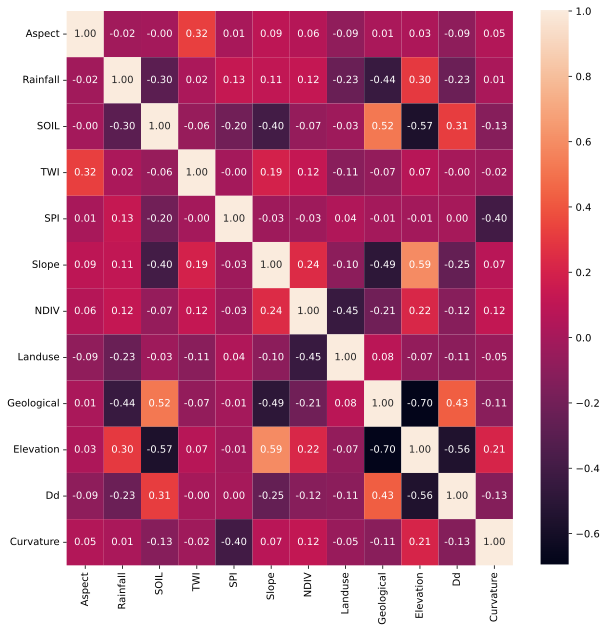

In [13]:
plt.figure(figsize=(10,10))
sns.heatmap(X_train.corr(),annot=True,fmt='.2f')
plt.show()

In [14]:
sns.pairplot(train_ds,hue='Training')
plt.show()

In [15]:
sns.pairplot(test_ds,hue='Testing')
plt.show()

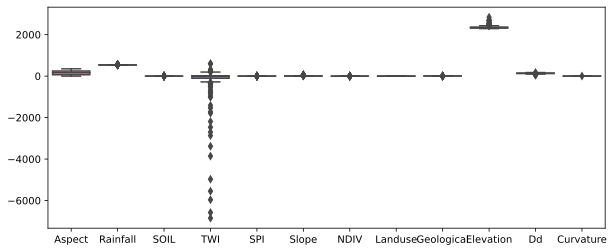

In [16]:
plt.figure(figsize=(10,4))
sns.boxplot(X_train)
plt.show()

# **Data Normalization and Validation Function**

In [17]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

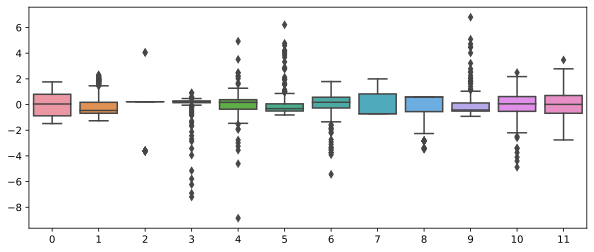

In [18]:
plt.figure(figsize=(10,4))
sns.boxplot(X_train)
plt.show()

In [44]:
r2Scores = []

In [39]:
def validation(y_test,y_pred):
  r2 = r2_score(y_test,y_pred)
  mae = mean_absolute_error(y_test,y_pred)
  mse = mean_squared_error(y_test,y_pred)
  rmse = np.sqrt(mse)
  print(f'R2 score:{r2} MAE:{mae} RMSE:{rmse}')
  return r2


# **First Model (Simple ANN)**

In [22]:
import tensorflow as tf
ann = tf.keras.models.Sequential([
    tf.keras.layers.Dense(16,input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(32),
    tf.keras.layers.Dense(8),
    tf.keras.layers.Dense(1)
])

In [23]:
ann.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                208       
                                                                 
 dense_1 (Dense)             (None, 32)                544       
                                                                 
 dense_2 (Dense)             (None, 8)                 264       
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 1,025
Trainable params: 1,025
Non-trainable params: 0
_________________________________________________________________


In [24]:
ann.compile(optimizer='adam',loss='mse')

In [25]:
r = ann.fit(X_train,y_train,epochs=100)

Epoch 1/100
9/9 [==============================] - 2s 7ms/step - loss: 1.4070
Epoch 2/100
9/9 [==============================] - 0s 3ms/step - loss: 0.7222
Epoch 3/100
9/9 [==============================] - 0s 3ms/step - loss: 0.4189
Epoch 4/100
9/9 [==============================] - 0s 3ms/step - loss: 0.2815
Epoch 5/100
9/9 [==============================] - 0s 3ms/step - loss: 0.2255
Epoch 6/100
9/9 [==============================] - 0s 3ms/step - loss: 0.1754
Epoch 7/100
9/9 [==============================] - 0s 3ms/step - loss: 0.1609
Epoch 8/100
9/9 [==============================] - 0s 3ms/step - loss: 0.1537
Epoch 9/100
9/9 [==============================] - 0s 9ms/step - loss: 0.1519
Epoch 10/100
9/9 [==============================] - 0s 6ms/step - loss: 0.1505
Epoch 11/100
9/9 [==============================] - 0s 3ms/step - loss: 0.1491
Epoch 12/100
9/9 [==============================] - 0s 3ms/step - loss: 0.1492
Epoch 13/100
9/9 [==============================] - 0s 3ms/st

In [47]:
y_pred = ann.predict(X_train)

9/9 [==============================] - 0s 3ms/step


In [48]:
r2Scores.append(validation(y_train,y_pred))

R2 score:0.43061013981689344 MAE:0.3304894965314356 RMSE:0.3770960643655588


In [28]:
y_pred = ann.predict(X_test)

4/4 [==============================] - 0s 4ms/step


In [45]:
validation(y_test,y_pred)

R2 score:0.3080123968206837 MAE:0.346100968362625 RMSE:0.414776820936147


0.3080123968206837

In [49]:
r2Scores

[0.43061013981689344]

In [30]:
y_pred = ann.predict(X_test)

4/4 [==============================] - 0s 3ms/step


In [35]:
validation(y_test,y_pred)

R2 score:0.3080123968206837 MAE:0.346100968362625 RMSE:0.414776820936147


In [36]:
r2Scores

[0.43061013981689344,
 0.3080123968206837,
 0.3080123968206837,
 0.3080123968206837]

# **CNN Model**

In [50]:
n_sample,n_features = X_train.shape
print(n_sample,n_features)

281 12


In [51]:
X_train_reshaped = X_train.reshape((n_sample,n_features,1))

In [52]:
cnn = tf.keras.models.Sequential([
    tf.keras.layers.Conv1D(8,kernel_size=3,activation='relu',input_shape=(n_features,1)),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(8,activation='relu'),
    tf.keras.layers.Dense(1),

])

In [53]:
cnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 10, 8)             32        
                                                                 
 max_pooling1d (MaxPooling1D  (None, 5, 8)             0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 40)                0         
                                                                 
 dense_4 (Dense)             (None, 8)                 328       
                                                                 
 dense_5 (Dense)             (None, 1)                 9         
                                                                 
Total params: 369
Trainable params: 369
Non-trainable params: 0
________________________________________________________

In [54]:
cnn.compile(optimizer='adam',loss='mse')

In [55]:
r = cnn.fit(X_train_reshaped,y_train,epochs=100)

Epoch 1/100
9/9 [==============================] - 1s 3ms/step - loss: 0.6923
Epoch 2/100
9/9 [==============================] - 0s 2ms/step - loss: 0.4476
Epoch 3/100
9/9 [==============================] - 0s 2ms/step - loss: 0.3618
Epoch 4/100
9/9 [==============================] - 0s 2ms/step - loss: 0.3155
Epoch 5/100
9/9 [==============================] - 0s 2ms/step - loss: 0.2820
Epoch 6/100
9/9 [==============================] - 0s 2ms/step - loss: 0.2591
Epoch 7/100
9/9 [==============================] - 0s 3ms/step - loss: 0.2426
Epoch 8/100
9/9 [==============================] - 0s 2ms/step - loss: 0.2310
Epoch 9/100
9/9 [==============================] - 0s 2ms/step - loss: 0.2188
Epoch 10/100
9/9 [==============================] - 0s 2ms/step - loss: 0.2097
Epoch 11/100
9/9 [==============================] - 0s 2ms/step - loss: 0.2009
Epoch 12/100
9/9 [==============================] - 0s 2ms/step - loss: 0.1932
Epoch 13/100
9/9 [==============================] - 0s 2ms/st

Text(0.5, 1.0, 'Loss Graph')

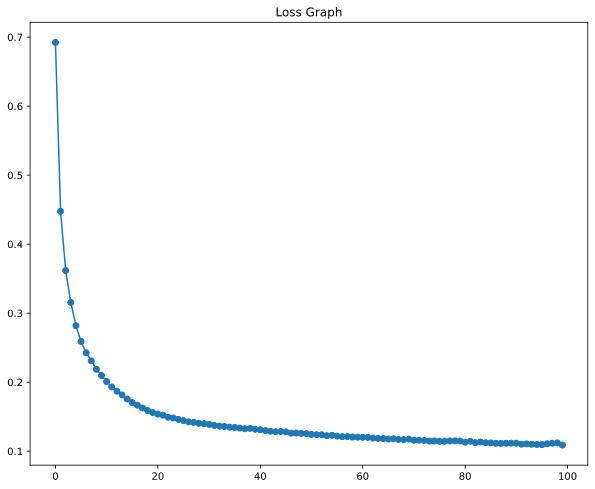

In [56]:
plt.figure(figsize=(10,8))
plt.plot(r.history['loss'],'o-')
plt.title('Loss Graph')

In [57]:
y_pred = cnn.predict(X_train_reshaped)

9/9 [==============================] - 0s 2ms/step


In [58]:
r2Scores.append(validation(y_train,y_pred))

R2 score:0.5659752268794098 MAE:0.2626799086499893 RMSE:0.3292337849386766


In [59]:
n_sample,n_features = X_test.shape
X_test_reshaped = X_test.reshape((n_sample,n_features,1))
y_pred = cnn.predict(X_test_reshaped)
validation(y_test,y_pred)

4/4 [==============================] - 0s 3ms/step
R2 score:0.3245596335709713 MAE:0.3091270982726546 RMSE:0.4097876139156203


0.3245596335709713

# **Model using GRU**

In [60]:
gru = tf.keras.models.Sequential([
    tf.keras.layers.GRU(16,input_shape=(n_features,1)),
    tf.keras.layers.Dense(16,activation='relu'),
    tf.keras.layers.Dense(1)
])

In [61]:
gru.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 16)                912       
                                                                 
 dense_6 (Dense)             (None, 16)                272       
                                                                 
 dense_7 (Dense)             (None, 1)                 17        
                                                                 
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________


In [62]:
gru.compile(optimizer='adam',loss='mse')

In [63]:
r = gru.fit(X_train_reshaped,y_train,epochs=100)

Epoch 1/100
9/9 [==============================] - 2s 10ms/step - loss: 0.4023
Epoch 2/100
9/9 [==============================] - 0s 8ms/step - loss: 0.3449
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.3053
Epoch 4/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2792
Epoch 5/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2634
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.2534
Epoch 7/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2466
Epoch 8/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2408
Epoch 9/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2342
Epoch 10/100
9/9 [==============================] - 0s 9ms/step - loss: 0.2284
Epoch 11/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2233
Epoch 12/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2183
Epoch 13/100
9/9 [==============================] - 0s 7ms/s

Text(0.5, 1.0, 'Loss Graph')

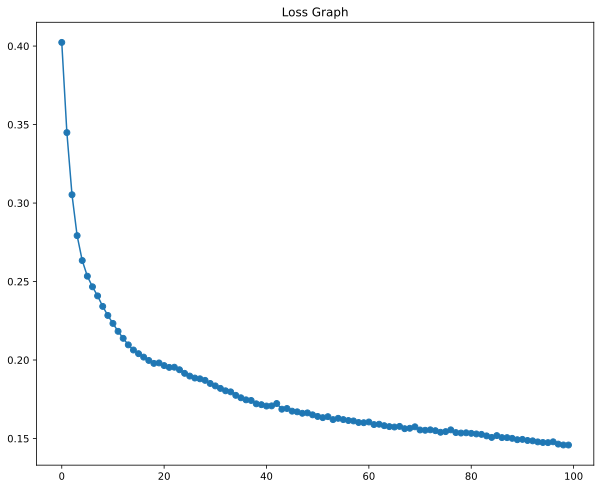

In [64]:
plt.figure(figsize=(10,8))
plt.plot(r.history['loss'],'o-')
plt.title('Loss Graph')

In [65]:
y_pred = gru.predict(X_train_reshaped)
r2Scores.append(validation(y_train,y_pred))

9/9 [==============================] - 1s 4ms/step
R2 score:0.4202032692375016 MAE:0.3060271923440207 RMSE:0.3805265963153802


In [66]:
y_pred = gru.predict(X_test_reshaped)
validation(y_test,y_pred)

4/4 [==============================] - 0s 6ms/step
R2 score:0.15498615955841033 MAE:0.3795145817470452 RMSE:0.45834999680248717


0.15498615955841033

# **LSTM Model**

In [67]:
lstm = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(16,input_shape=(n_features,1)),
    tf.keras.layers.Dense(16,activation='relu'),
    tf.keras.layers.Dense(1)
])

In [68]:
lstm.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 16)                1152      
                                                                 
 dense_8 (Dense)             (None, 16)                272       
                                                                 
 dense_9 (Dense)             (None, 1)                 17        
                                                                 
Total params: 1,441
Trainable params: 1,441
Non-trainable params: 0
_________________________________________________________________


In [69]:
lstm.compile(optimizer='adam',loss='mse')

In [70]:
r = lstm.fit(X_train_reshaped,y_train,epochs=100)

Epoch 1/100
9/9 [==============================] - 2s 7ms/step - loss: 0.4543
Epoch 2/100
9/9 [==============================] - 0s 8ms/step - loss: 0.4080
Epoch 3/100
9/9 [==============================] - 0s 7ms/step - loss: 0.3521
Epoch 4/100
9/9 [==============================] - 0s 6ms/step - loss: 0.2965
Epoch 5/100
9/9 [==============================] - 0s 6ms/step - loss: 0.2546
Epoch 6/100
9/9 [==============================] - 0s 6ms/step - loss: 0.2459
Epoch 7/100
9/9 [==============================] - 0s 7ms/step - loss: 0.2376
Epoch 8/100
9/9 [==============================] - 0s 6ms/step - loss: 0.2325
Epoch 9/100
9/9 [==============================] - 0s 6ms/step - loss: 0.2293
Epoch 10/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2220
Epoch 11/100
9/9 [==============================] - 0s 6ms/step - loss: 0.2164
Epoch 12/100
9/9 [==============================] - 0s 8ms/step - loss: 0.2109
Epoch 13/100
9/9 [==============================] - 0s 6ms/st

Text(0.5, 1.0, 'Loss Graph')

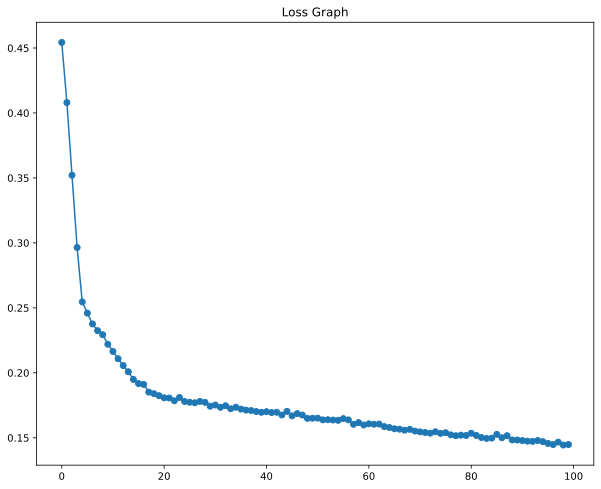

In [71]:
plt.figure(figsize=(10,8))
plt.plot(r.history['loss'],'o-')
plt.title('Loss Graph')

In [72]:
y_pred = lstm.predict(X_train_reshaped)
r2Scores.append(validation(y_train,y_pred))

9/9 [==============================] - 1s 3ms/step
R2 score:0.42415496045098433 MAE:0.3014080249687849 RMSE:0.379227611249244


In [73]:
y_pred = lstm.predict(X_test_reshaped)
validation(y_test,y_pred)

4/4 [==============================] - 0s 4ms/step
R2 score:0.11904352004086793 MAE:0.3761218997288095 RMSE:0.46799643919878453


0.11904352004086793

In [74]:
r2Scores

[0.43061013981689344,
 0.5659752268794098,
 0.4202032692375016,
 0.42415496045098433]

# **Second ANN model with more parameter and better network**

In [75]:

ann2 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(16,activation='relu',input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(32,activation='relu'),
    tf.keras.layers.Dense(8,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid')
])



In [76]:
print(ann2.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 16)                208       
                                                                 
 dense_11 (Dense)            (None, 32)                544       
                                                                 
 dense_12 (Dense)            (None, 8)                 264       
                                                                 
 dense_13 (Dense)            (None, 1)                 9         
                                                                 
Total params: 1,025
Trainable params: 1,025
Non-trainable params: 0
_________________________________________________________________
None


In [77]:

ann2.compile(optimizer='adam',loss='binary_crossentropy')
r = ann2.fit(X_train,y_train,epochs=200)

Epoch 1/200
9/9 [==============================] - 2s 2ms/step - loss: 0.7020
Epoch 2/200
9/9 [==============================] - 0s 2ms/step - loss: 0.6846
Epoch 3/200
9/9 [==============================] - 0s 2ms/step - loss: 0.6691
Epoch 4/200
9/9 [==============================] - 0s 2ms/step - loss: 0.6517
Epoch 5/200
9/9 [==============================] - 0s 2ms/step - loss: 0.6323
Epoch 6/200
9/9 [==============================] - 0s 2ms/step - loss: 0.6064
Epoch 7/200
9/9 [==============================] - 0s 2ms/step - loss: 0.5768
Epoch 8/200
9/9 [==============================] - 0s 2ms/step - loss: 0.5499
Epoch 9/200
9/9 [==============================] - 0s 3ms/step - loss: 0.5278
Epoch 10/200
9/9 [==============================] - 0s 2ms/step - loss: 0.5101
Epoch 11/200
9/9 [==============================] - 0s 2ms/step - loss: 0.4932
Epoch 12/200
9/9 [==============================] - 0s 2ms/step - loss: 0.4750
Epoch 13/200
9/9 [==============================] - 0s 2ms/st

Text(0.5, 1.0, 'Loss Graph')

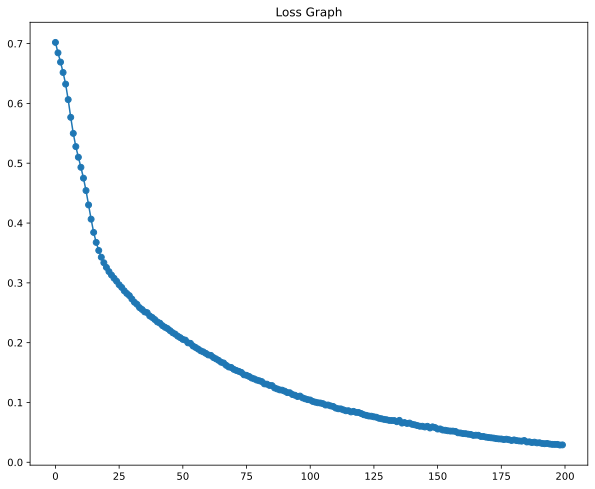

In [78]:
plt.figure(figsize=(10,8))
plt.plot(r.history['loss'],'o-')
plt.title('Loss Graph')


In [79]:

y_pred = ann2.predict(X_train)
r2Scores.append(validation(y_train,y_pred))

9/9 [==============================] - 0s 2ms/step
R2 score:0.9749771661602755 MAE:0.021643746798694526 RMSE:0.07905245860247616


# **Longer ANN model**

In [80]:
ann3 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(16,activation='relu',input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(32,activation='relu'),
    tf.keras.layers.Dense(32,activation='relu'),
    tf.keras.layers.Dense(16,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid')
])

In [81]:

print(ann3.summary())
ann3.compile(optimizer='adam',loss='binary_crossentropy')

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_14 (Dense)            (None, 16)                208       
                                                                 
 dense_15 (Dense)            (None, 32)                544       
                                                                 
 dense_16 (Dense)            (None, 32)                1056      
                                                                 
 dense_17 (Dense)            (None, 16)                528       
                                                                 
 dense_18 (Dense)            (None, 1)                 17        
                                                                 
Total params: 2,353
Trainable params: 2,353
Non-trainable params: 0
_________________________________________________________________
None


In [82]:
r = ann3.fit(X_train,y_train,epochs=200)

Epoch 1/200
9/9 [==============================] - 2s 4ms/step - loss: 0.7125
Epoch 2/200
9/9 [==============================] - 0s 4ms/step - loss: 0.6629
Epoch 3/200
9/9 [==============================] - 0s 3ms/step - loss: 0.6323
Epoch 4/200
9/9 [==============================] - 0s 4ms/step - loss: 0.5999
Epoch 5/200
9/9 [==============================] - 0s 4ms/step - loss: 0.5621
Epoch 6/200
9/9 [==============================] - 0s 4ms/step - loss: 0.5251
Epoch 7/200
9/9 [==============================] - 0s 4ms/step - loss: 0.4873
Epoch 8/200
9/9 [==============================] - 0s 4ms/step - loss: 0.4581
Epoch 9/200
9/9 [==============================] - 0s 4ms/step - loss: 0.4302
Epoch 10/200
9/9 [==============================] - 0s 3ms/step - loss: 0.4108
Epoch 11/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3938
Epoch 12/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3795
Epoch 13/200
9/9 [==============================] - 0s 3ms/st

Text(0.5, 1.0, 'Loss Graph')

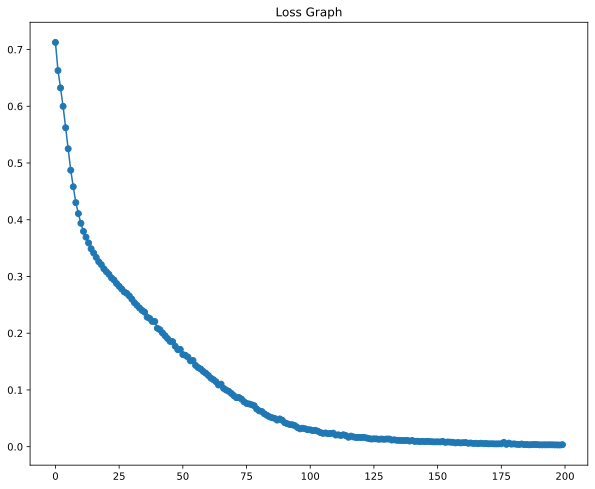

In [83]:


plt.figure(figsize=(10,8))
plt.plot(r.history['loss'],'o-')
plt.title('Loss Graph')


In [84]:

y_pred = ann3.predict(X_train)
r2Scores.append(validation(y_train,y_pred))

9/9 [==============================] - 0s 6ms/step
R2 score:0.998479310275392 MAE:0.002730577184042438 RMSE:0.019488007634846583


# **Longer and Wider Model**

In [85]:

ann4 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(16,activation='relu',input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(32,activation='relu'),
    tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dense(32,activation='relu'),
    tf.keras.layers.Dense(16,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid')
])

In [86]:

print(ann4.summary())
ann4.compile(optimizer='adam',loss='binary_crossentropy')

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_19 (Dense)            (None, 16)                208       
                                                                 
 dense_20 (Dense)            (None, 32)                544       
                                                                 
 dense_21 (Dense)            (None, 64)                2112      
                                                                 
 dense_22 (Dense)            (None, 32)                2080      
                                                                 
 dense_23 (Dense)            (None, 16)                528       
                                                                 
 dense_24 (Dense)            (None, 1)                 17        
                                                                 
Total params: 5,489
Trainable params: 5,489
Non-traina

In [87]:
r = ann4.fit(X_train,y_train,epochs=200)

Epoch 1/200
9/9 [==============================] - 1s 3ms/step - loss: 0.6839
Epoch 2/200
9/9 [==============================] - 0s 2ms/step - loss: 0.6630
Epoch 3/200
9/9 [==============================] - 0s 2ms/step - loss: 0.6376
Epoch 4/200
9/9 [==============================] - 0s 2ms/step - loss: 0.6063
Epoch 5/200
9/9 [==============================] - 0s 2ms/step - loss: 0.5710
Epoch 6/200
9/9 [==============================] - 0s 2ms/step - loss: 0.5253
Epoch 7/200
9/9 [==============================] - 0s 2ms/step - loss: 0.4846
Epoch 8/200
9/9 [==============================] - 0s 3ms/step - loss: 0.4416
Epoch 9/200
9/9 [==============================] - 0s 2ms/step - loss: 0.3973
Epoch 10/200
9/9 [==============================] - 0s 2ms/step - loss: 0.3623
Epoch 11/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3431
Epoch 12/200
9/9 [==============================] - 0s 2ms/step - loss: 0.3235
Epoch 13/200
9/9 [==============================] - 0s 4ms/st

Text(0.5, 1.0, 'Loss Graph')

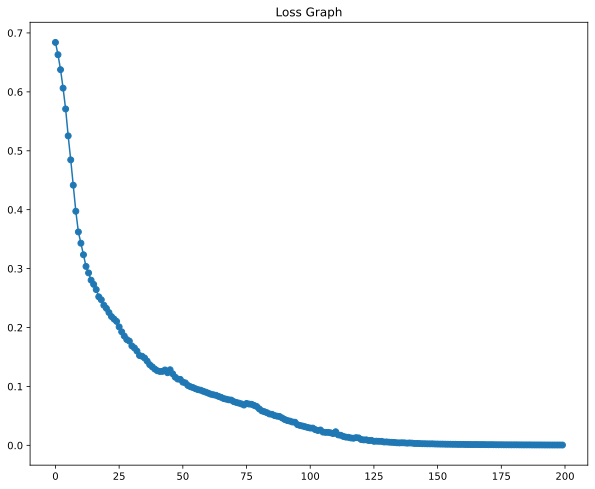

In [88]:

plt.figure(figsize=(10,8))
plt.plot(r.history['loss'],'o-')
plt.title('Loss Graph')


In [89]:

y_pred = ann4.predict(X_train)
r2Scores.append(validation(y_train,y_pred))

9/9 [==============================] - 0s 3ms/step
R2 score:0.9999789766931474 MAE:0.0005624587245735519 RMSE:0.002291382806493362


# **Wider but shorter Model**

In [90]:
ann5 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(512,activation='relu',input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(1,activation='sigmoid')
])

In [91]:

print(ann5.summary())
ann5.compile(optimizer='adam',loss='binary_crossentropy')

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_25 (Dense)            (None, 512)               6656      
                                                                 
 dense_26 (Dense)            (None, 1)                 513       
                                                                 
Total params: 7,169
Trainable params: 7,169
Non-trainable params: 0
_________________________________________________________________
None


In [92]:
r = ann5.fit(X_train,y_train,epochs=200)

Epoch 1/200
9/9 [==============================] - 1s 2ms/step - loss: 0.6343
Epoch 2/200
9/9 [==============================] - 0s 2ms/step - loss: 0.5165
Epoch 3/200
9/9 [==============================] - 0s 2ms/step - loss: 0.4534
Epoch 4/200
9/9 [==============================] - 0s 3ms/step - loss: 0.4160
Epoch 5/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3930
Epoch 6/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3772
Epoch 7/200
9/9 [==============================] - 0s 2ms/step - loss: 0.3633
Epoch 8/200
9/9 [==============================] - 0s 2ms/step - loss: 0.3516
Epoch 9/200
9/9 [==============================] - 0s 2ms/step - loss: 0.3425
Epoch 10/200
9/9 [==============================] - 0s 2ms/step - loss: 0.3350
Epoch 11/200
9/9 [==============================] - 0s 2ms/step - loss: 0.3275
Epoch 12/200
9/9 [==============================] - 0s 3ms/step - loss: 0.3211
Epoch 13/200
9/9 [==============================] - 0s 2ms/st

Text(0.5, 1.0, 'Loss Graph')

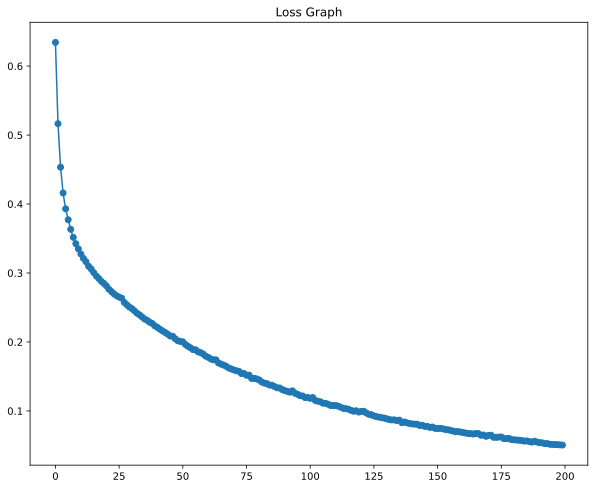

In [93]:

plt.figure(figsize=(10,8))
plt.plot(r.history['loss'],'o-')
plt.title('Loss Graph')


In [94]:

y_pred = ann5.predict(X_train)
r2Scores.append(validation(y_train,y_pred))

9/9 [==============================] - 0s 2ms/step
R2 score:0.9569121572090408 MAE:0.039107394662783894 RMSE:0.10373480888328643


# **Wider and little longer model**

In [95]:
ann6 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(512,activation='relu',input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(1024,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid')
])

In [96]:

print(ann6.summary())
ann6.compile(optimizer='adam',loss='binary_crossentropy')

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_27 (Dense)            (None, 512)               6656      
                                                                 
 dense_28 (Dense)            (None, 1024)              525312    
                                                                 
 dense_29 (Dense)            (None, 1)                 1025      
                                                                 
Total params: 532,993
Trainable params: 532,993
Non-trainable params: 0
_________________________________________________________________
None


In [97]:
r = ann6.fit(X_train,y_train,epochs=200)

Epoch 1/200
9/9 [==============================] - 1s 10ms/step - loss: 0.5149
Epoch 2/200
9/9 [==============================] - 0s 10ms/step - loss: 0.3752
Epoch 3/200
9/9 [==============================] - 0s 11ms/step - loss: 0.3383
Epoch 4/200
9/9 [==============================] - 0s 13ms/step - loss: 0.2950
Epoch 5/200
9/9 [==============================] - 0s 15ms/step - loss: 0.2733
Epoch 6/200
9/9 [==============================] - 0s 16ms/step - loss: 0.2543
Epoch 7/200
9/9 [==============================] - 0s 16ms/step - loss: 0.2450
Epoch 8/200
9/9 [==============================] - 0s 16ms/step - loss: 0.2219
Epoch 9/200
9/9 [==============================] - 0s 16ms/step - loss: 0.2008
Epoch 10/200
9/9 [==============================] - 0s 15ms/step - loss: 0.1880
Epoch 11/200
9/9 [==============================] - 0s 19ms/step - loss: 0.1753
Epoch 12/200
9/9 [==============================] - 0s 16ms/step - loss: 0.1519
Epoch 13/200
9/9 [==============================]

Text(0.5, 1.0, 'Loss Graph')

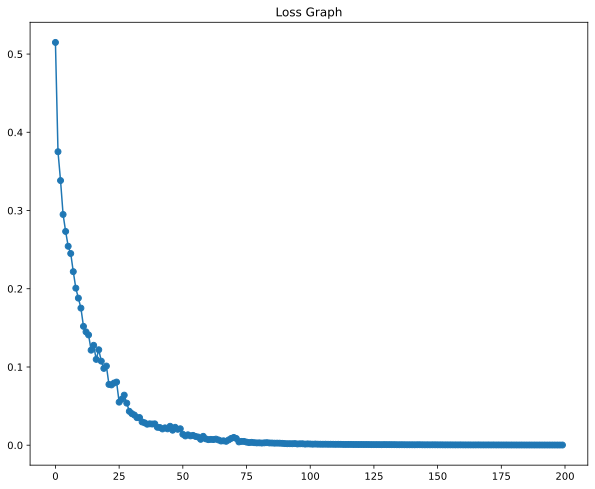

In [98]:

plt.figure(figsize=(10,8))
plt.plot(r.history['loss'],'o-')
plt.title('Loss Graph')


In [99]:

y_pred = ann6.predict(X_train)
r2Scores.append(validation(y_train,y_pred))

9/9 [==============================] - 0s 3ms/step
R2 score:0.999996570521356 MAE:0.00021304673439168903 RMSE:0.0009254675313534913


In [100]:
r2Scores

[0.43061013981689344,
 0.5659752268794098,
 0.4202032692375016,
 0.42415496045098433,
 0.9749771661602755,
 0.998479310275392,
 0.9999789766931474,
 0.9569121572090408,
 0.999996570521356]

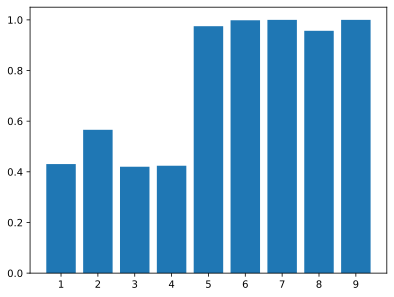

In [106]:
plt.bar([1,2,3,4,5,6,7,8,9],r2Scores)
plt.xticks([1,2,3,4,5,6,7,8,9])
plt.show()